Welcome to JupyROOT 6.28/04
Reading file: rec.mu2e.CRV_wideband_cosmics.CRVWB-000-005-000.001678_000.root


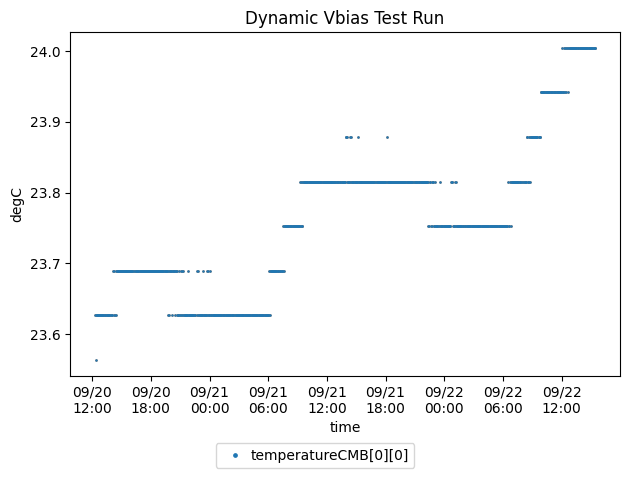

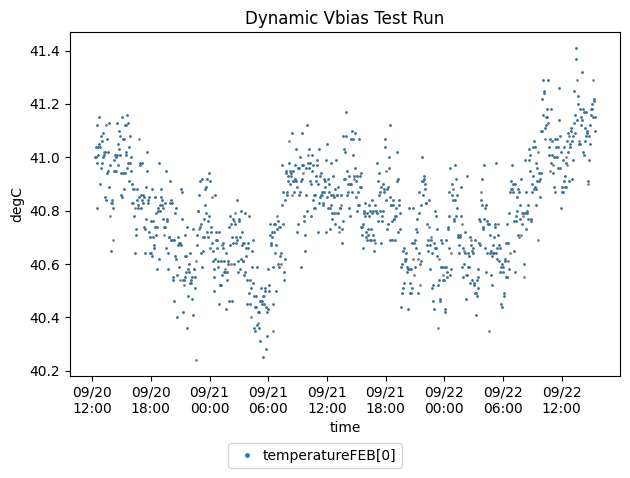

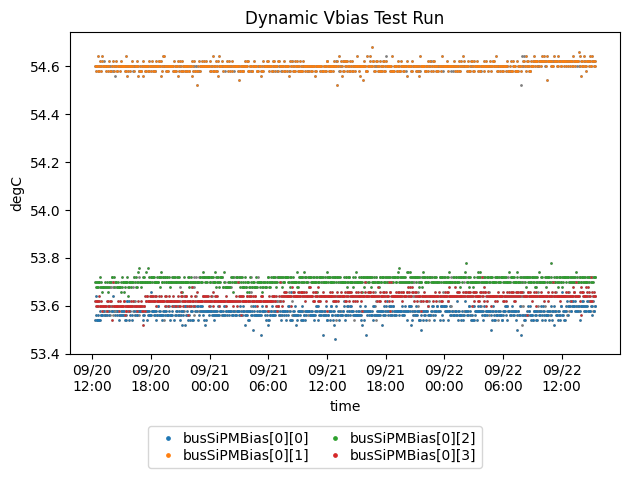

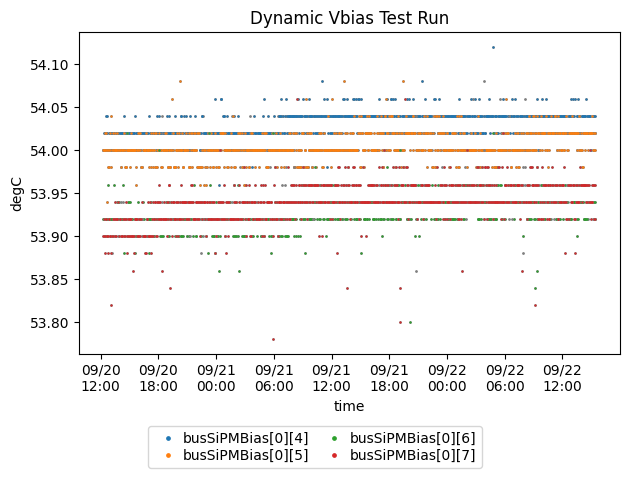

In [1]:
from __future__ import print_function
import sys, os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages

import ROOT
from ROOT import gROOT, gStyle, gDirectory, gPad

from array import array

import constants
import crv_event
import crv_spill
import utils
import geometry
import geometry_constants
import filepath

gROOT.Reset()
gROOT.SetBatch(1)
gROOT.ProcessLine( "gErrorIgnoreLevel = 1001;")
gStyle.SetOptStat(111110)
gStyle.SetOptFit(0)
gStyle.SetLineScalePS(0.3)

topdir = os.path.dirname(os.path.abspath("__file__"))
settings_dir = os.path.join(topdir,"settings")

filename = filepath.getfilelist([1678],"recoROOT",5)[0][0]
logname = os.path.join(settings_dir, "raw.mu2e.CRV_wideband_cosmics.crvaging-006.001678_settings_history.log")

nSmooth = 1 
tdict = {'*':[["temperatureCMB[0][0]"],  
              ["temperatureFEB[0]"],
              ["busSiPMBias[0][0:4]"],
              ["busSiPMBias[0][4:8]"]]}

tfig = utils.plot_dqm([filename], tdict, '== 0x0', False, nSmooth, True, "Dynamic Vbias Test Run;time;degC")

In [2]:
import pandas as pd
from scipy import stats
import settings_FEB

def ParseLog(logname, filename, nFEB):
    df = pd.DataFrame()
    settingsReference = [None]*nFEB

    fFile = ROOT.TFile(filename, "READ")
    spilltree = fFile.Get("spills")
    nSpill = spilltree.GetEntries()
    nSkippedSpillIndex = 0

    with open(logname, 'r') as fin:
        data = fin.read()
        data = data.replace("##", "*")
        data = data.replace("# FEB Temp.:", "# FEBTemp.:")
        data = data.split("# Spill ")

        referenceBlock = data[0]
        data = data[1:]

        referenceBlock = referenceBlock.split("--- FEB ")[1:]
        for iFEB in range(nFEB):
            FEBBlock = referenceBlock[iFEB].split("\n")
            settingsReference[iFEB] = settings_FEB.settingsFEB(FEBBlock[4], " ".join(FEBBlock[6:10]), FEBBlock[11], None, None, 20.0, 40.0)
            
        for index, block in enumerate(data):
            fields = block.split("# FEB ")
            #print(fields)

            logSpillNum = int(fields[0].split()[0])

            tSpill = None
            if logSpillNum-nSkippedSpillIndex < nSpill:
                tSpill = crv_spill.crv_spill(spilltree, logSpillNum-nSkippedSpillIndex)
                if tSpill.spillIndex == logSpillNum-nSkippedSpillIndex+1 and tSpill.spillIndex == tSpill.spillNumber:
                    # print(tSpill.spillNumber,tSpill.spillIndex, logSpillNum, nSkippedSpillIndex)
                    pass
                else:
                    print(tSpill.spillNumber,tSpill.spillIndex, logSpillNum, nSkippedSpillIndex)
                    if tSpill.spillIndex < tSpill.spillNumber+2 and tSpill.spillIndex>tSpill.spillNumber-2:
                        pass # FIXME # nSkippedSpillIndex += 1
                    tSpill = None
                    
            for iFEB in range(nFEB):
                df_ = pd.DataFrame()
                FEBBlock = fields[iFEB+1].split("\n")
                #print(FEBBlock)
                df_['spillNum'] = [logSpillNum]
                df_['FEB'] = [int(FEBBlock[0].split(":")[0])]

                thisCMBTempStr = FEBBlock[2]
                thisFEBTempStr = FEBBlock[3]

                NorminalSettings = settingsReference[iFEB].AdjustBulkByTemp(thisCMBTempStr, thisFEBTempStr)
                for i in range(8):
                    df_['bulkNominal%i'%i] = [NorminalSettings.bulks[i]]

                AppliedSettings = settings_FEB.settingsFEB(FEBBlock[9], " ".join(FEBBlock[11:15]), FEBBlock[16], thisCMBTempStr, thisFEBTempStr)
                for i in range(8):
                    df_['bulkSettings%i'%i] = [AppliedSettings.bulks[i]]

                readBackmV = FEBBlock[19].split()
                for i in range(8):
                    df_['readBackVAtSetup%i'%i] = [float(readBackmV[i])/21.*20.]
                    df_['readBackVAtSpill%i'%i] = [0. if tSpill is None else tSpill.busSiPMBias[iFEB][i]]
                    # df_['readBackVAtSpill%i'%i] = [0. if tSpill is None else tSpill.bulkBiasRdbk[iFEB][i*8]]

                df_['goodFEBTemp'] = [True if (float(thisFEBTempStr)<60 and float(thisFEBTempStr)!=-999.) else False]
                df_['goodReadbk'] = [False if FEBBlock[19] == "0 0 0 0 0 0 0 0 " else True]
                df_['goodRdbkSpill'] = [False if (tSpill is None or np.any(tSpill.busSiPMBias[iFEB]<1)) else True]

                df = pd.concat([df,df_], ignore_index=True)

    fFile.Close()
    return df

df = ParseLog(logname, filename, 6)
display(df)

4092 206 205 0
4090 803 802 0
4091 839 838 0


,spillNum,FEB,bulkNominal0,bulkNominal1,bulkNominal2,bulkNominal3,bulkNominal4,bulkNominal5,bulkNominal6,bulkNominal7,...,readBackVAtSpill4,readBackVAtSetup5,readBackVAtSpill5,readBackVAtSetup6,readBackVAtSpill6,readBackVAtSetup7,readBackVAtSpill7,goodFEBTemp,goodReadbk,goodRdbkSpill
0,0,0,2689.486410,2721.746097,2686.313285,2683.226723,2699.967035,2677.659535,2696.793910,2697.053597,...,54.00,53.942857,54.00,53.819048,53.92,53.838095,53.90,True,True,True
1,0,1,2688.892043,2720.978605,2685.372667,2682.545793,2699.805480,2676.459230,2696.286105,2696.286105,...,53.86,53.742857,53.78,53.838095,53.96,53.923810,53.92,True,True,True
2,0,2,2688.306527,2720.652777,2685.133403,2682.133403,2698.700590,2675.787153,2696.046840,2696.046840,...,54.10,53.257143,53.30,53.961905,53.98,53.723810,53.78,True,True,True
3,0,3,2687.850548,2720.802735,2685.023672,2681.850548,2699.196797,2675.850548,2695.677422,2695.504298,...,54.02,53.942857,53.94,54.400000,54.40,53.561905,53.56,True,True,True
4,0,4,2686.777650,2718.864213,2683.777650,2680.950775,2697.258275,2674.604525,2694.604525,2694.691087,...,53.98,53.580952,53.62,53.942857,53.98,54.123810,54.10,True,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6109,1018,1,2689.857173,2722.116860,2686.424360,2683.597485,2700.857173,2677.510923,2697.424360,2697.424360,...,0.00,53.904762,0.00,54.038095,0.00,54.085714,0.00,True,True,False
6110,1018,2,2689.407300,2721.840113,2686.320738,2683.234175,2699.887925,2677.061050,2697.234175,2697.147612,...,0.00,53.438095,0.00,54.104762,0.00,53.904762,0.00,True,True,False
6111,1018,3,2688.827947,2721.693572,2686.174197,2682.827947,2700.260760,2677.001073,2696.741385,2696.568260,...,0.00,54.085714,0.00,54.561905,0.00,53.723810,0.00,True,True,False
6112,1018,4,2687.733927,2719.820490,2684.820490,2681.993615,2698.301115,2675.647365,2695.733927,2695.820490,...,0.00,53.742857,0.00,54.104762,0.00,54.266667,0.00,True,True,False


In [3]:
df_ = df.query("goodFEBTemp==False | goodReadbk==False").reset_index()
display(df_)

,index,spillNum,FEB,bulkNominal0,bulkNominal1,bulkNominal2,bulkNominal3,bulkNominal4,bulkNominal5,bulkNominal6,...,readBackVAtSpill4,readBackVAtSetup5,readBackVAtSpill5,readBackVAtSetup6,readBackVAtSpill6,readBackVAtSetup7,readBackVAtSpill7,goodFEBTemp,goodReadbk,goodRdbkSpill
0,778,129,4,2686.911248,2719.084372,2683.997810,2681.170935,2697.478435,2674.824685,2694.911248,...,54.00,0.000000,53.62,0.000000,53.96,0.000000,54.12,True,False,True
1,1126,187,4,2686.925563,2719.098687,2684.012125,2681.098687,2697.492750,2674.839000,2694.925563,...,54.02,0.000000,53.62,0.000000,53.96,0.000000,54.14,True,False,True
2,1466,244,2,2641.985905,2674.505280,2638.899342,2635.812780,2652.553092,2629.726218,2649.899342,...,54.10,53.438095,53.32,54.085714,53.98,53.885714,53.76,False,True,True
3,1823,303,5,2900.093000,2932.352687,2897.093000,2894.093000,2910.746750,2887.746750,2908.439250,...,53.98,53.485714,53.36,54.104762,53.98,53.942857,53.90,False,True,True
4,2171,361,5,2900.266125,2932.352687,2897.179562,2894.352687,2910.833312,2887.919875,2908.612375,...,-0.02,53.485714,-0.02,54.085714,-0.02,54.000000,-0.02,False,True,False
5,2199,366,3,2688.037987,2720.990175,2685.384237,2682.124550,2699.557363,2676.211113,2695.951425,...,54.02,0.000000,53.96,0.000000,54.44,0.000000,53.60,True,False,True
6,2519,419,5,2687.096670,2719.269795,2684.010107,2681.183233,2697.663858,2674.663858,2695.442920,...,54.00,0.000000,53.40,0.000000,54.00,0.000000,53.94,True,False,True
7,2547,424,3,2901.304875,2934.257062,2898.651125,2895.304875,2912.824250,2889.391437,2909.218313,...,54.04,54.038095,53.94,54.523810,54.44,53.704762,53.60,False,True,True
8,2895,482,3,2688.400598,2721.439348,2685.746848,2682.400598,2699.919972,2676.573722,2696.314035,...,54.04,0.000000,53.98,0.000000,54.44,0.000000,53.60,True,False,True
9,3244,540,4,2687.301115,2719.387677,2684.474240,2681.474240,2697.954865,2675.214553,2695.301115,...,54.02,0.000000,53.64,0.000000,54.00,0.000000,54.12,True,False,True


In [4]:
df_ = df.query("goodRdbkSpill==False").reset_index()
display(df_)

,index,spillNum,FEB,bulkNominal0,bulkNominal1,bulkNominal2,bulkNominal3,bulkNominal4,bulkNominal5,bulkNominal6,...,readBackVAtSpill4,readBackVAtSetup5,readBackVAtSpill5,readBackVAtSetup6,readBackVAtSpill6,readBackVAtSetup7,readBackVAtSpill7,goodFEBTemp,goodReadbk,goodRdbkSpill
0,137,22,5,2686.742240,2718.828803,2683.569115,2680.742240,2697.222865,2674.222865,2695.001927,...,-0.02,53.438095,-0.02,54.123810,-0.02,54.038095,-0.02,True,True,False
1,185,30,5,2686.732015,2718.818578,2683.558890,2680.732015,2697.212640,2674.212640,2694.991702,...,-0.02,53.438095,-0.02,54.104762,-0.02,53.980952,-0.02,True,True,False
2,244,40,4,2686.866257,2718.866257,2683.952820,2681.039383,2697.433445,2674.693133,2694.779695,...,-0.02,53.723810,-0.02,54.066667,-0.02,54.219048,-0.02,True,True,False
3,485,80,5,2686.935815,2719.022377,2683.676127,2680.849253,2697.329877,2674.416440,2695.108940,...,-0.02,53.457143,-0.02,54.104762,-0.02,53.942857,-0.02,True,True,False
4,497,82,5,2686.772915,2719.032602,2683.686352,2680.859478,2697.340102,2674.426665,2695.205728,...,-0.02,53.485714,-0.02,54.104762,-0.02,53.980952,-0.02,True,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75,6109,1018,1,2689.857173,2722.116860,2686.424360,2683.597485,2700.857173,2677.510923,2697.424360,...,0.00,53.904762,0.00,54.038095,0.00,54.085714,0.00,True,True,False
76,6110,1018,2,2689.407300,2721.840113,2686.320738,2683.234175,2699.887925,2677.061050,2697.234175,...,0.00,53.438095,0.00,54.104762,0.00,53.904762,0.00,True,True,False
77,6111,1018,3,2688.827947,2721.693572,2686.174197,2682.827947,2700.260760,2677.001073,2696.741385,...,0.00,54.085714,0.00,54.561905,0.00,53.723810,0.00,True,True,False
78,6112,1018,4,2687.733927,2719.820490,2684.820490,2681.993615,2698.301115,2675.647365,2695.733927,...,0.00,53.742857,0.00,54.104762,0.00,54.266667,0.00,True,True,False


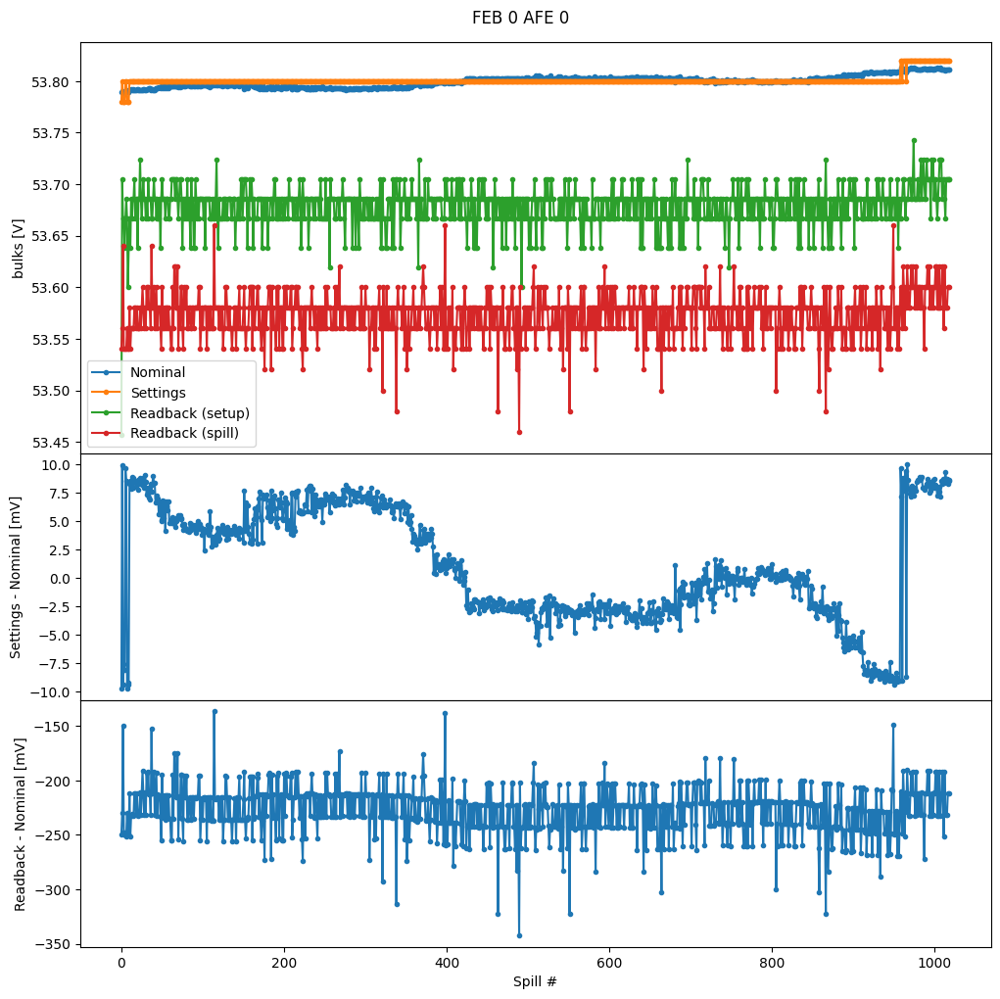

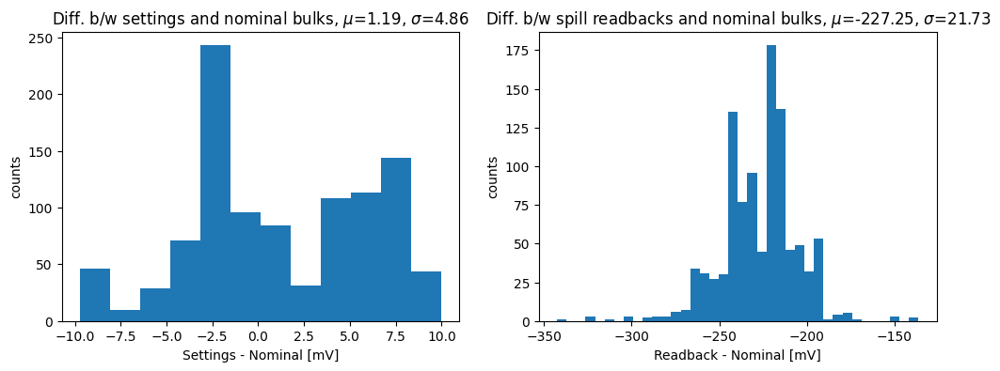

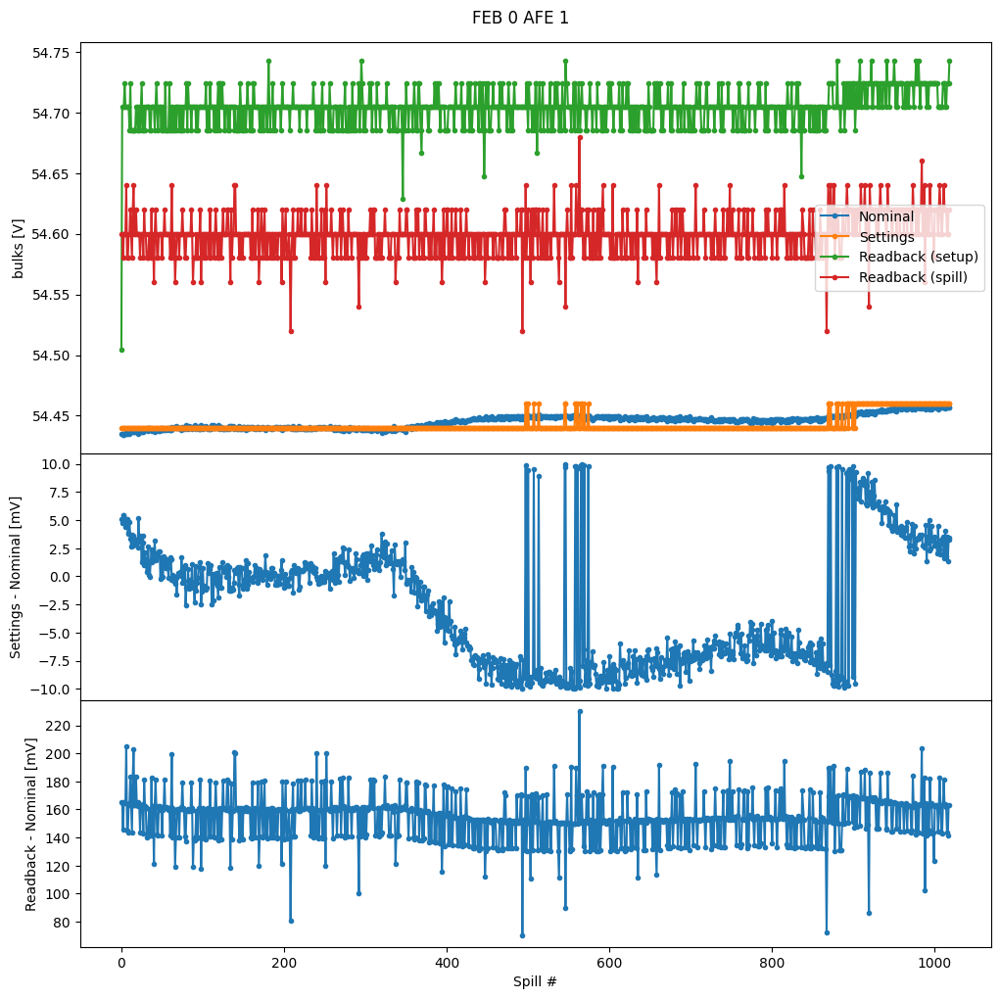

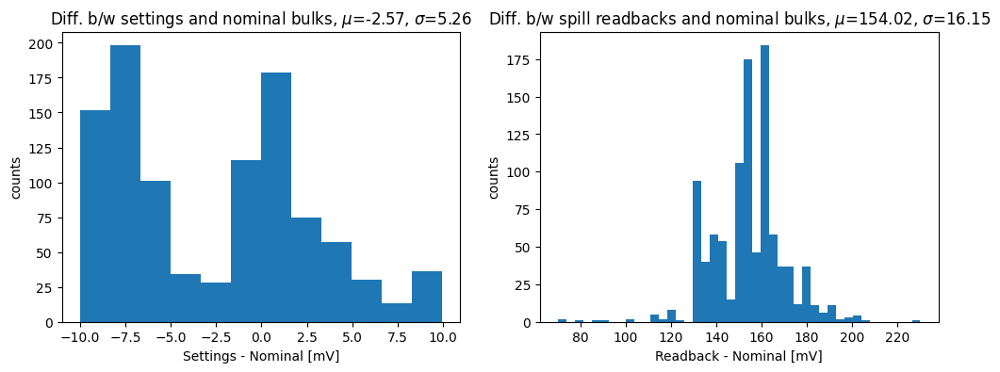

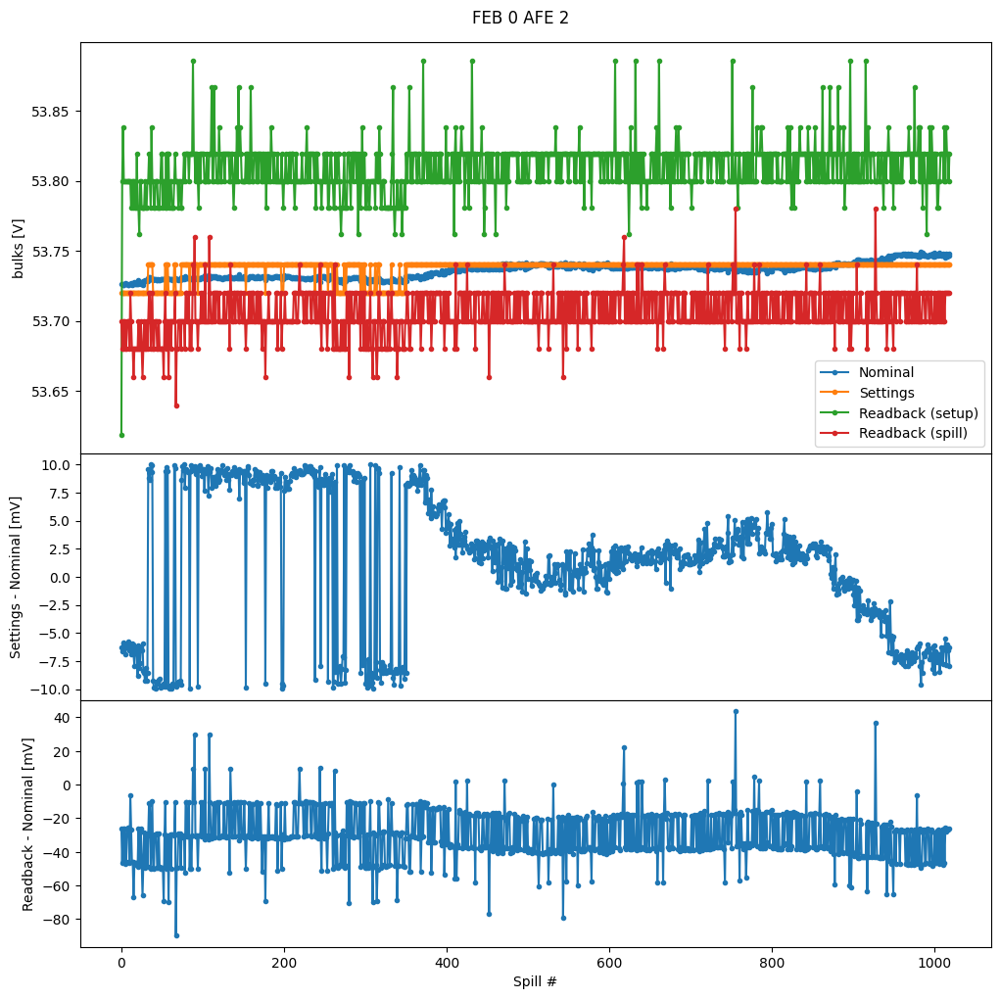

...

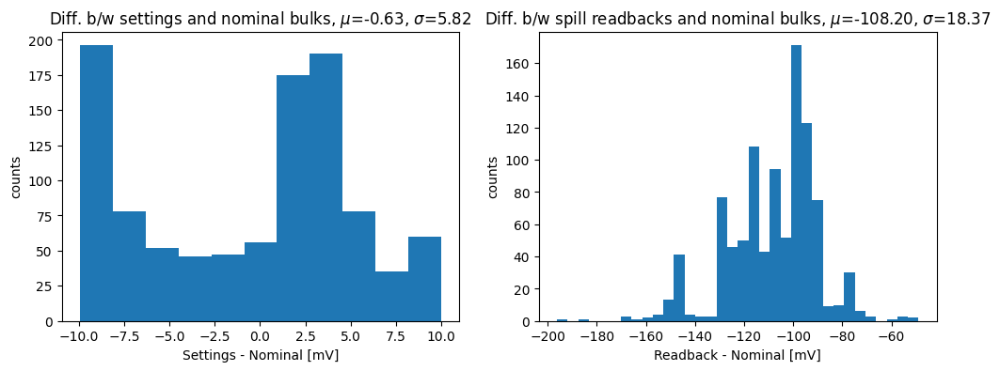

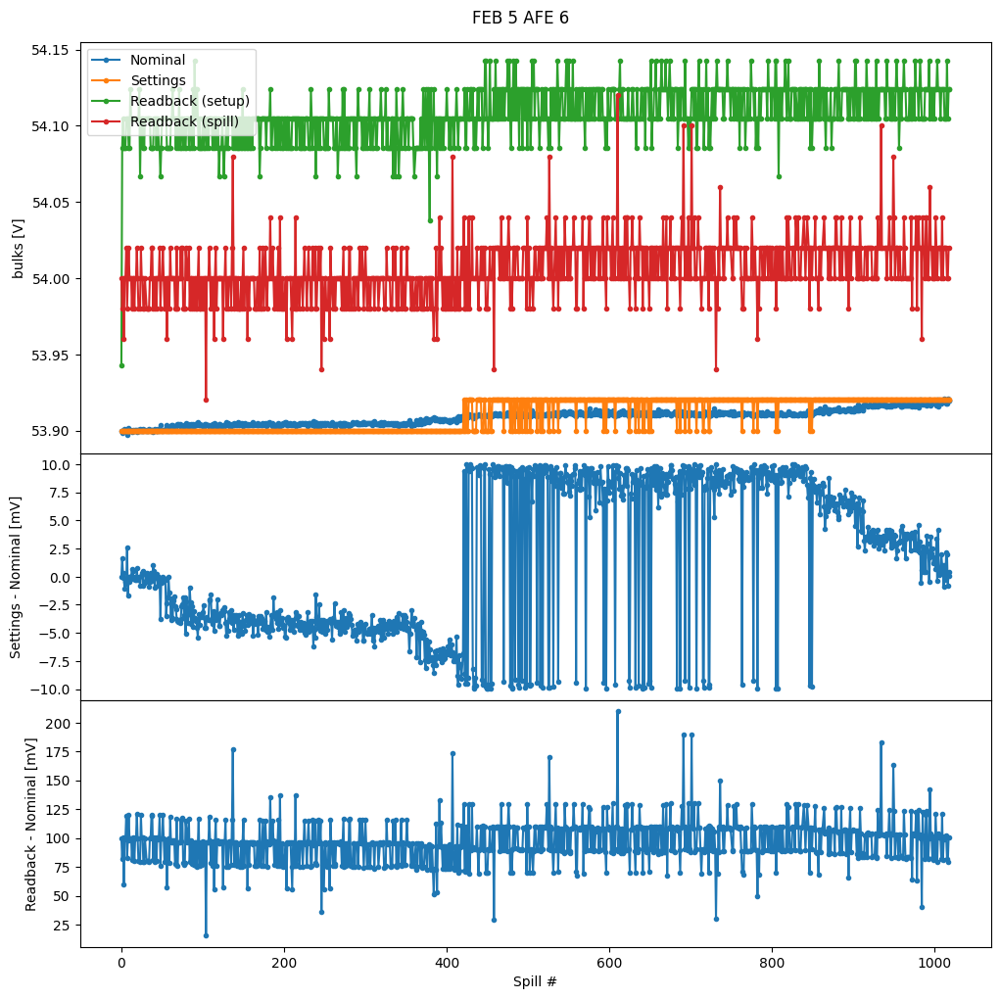

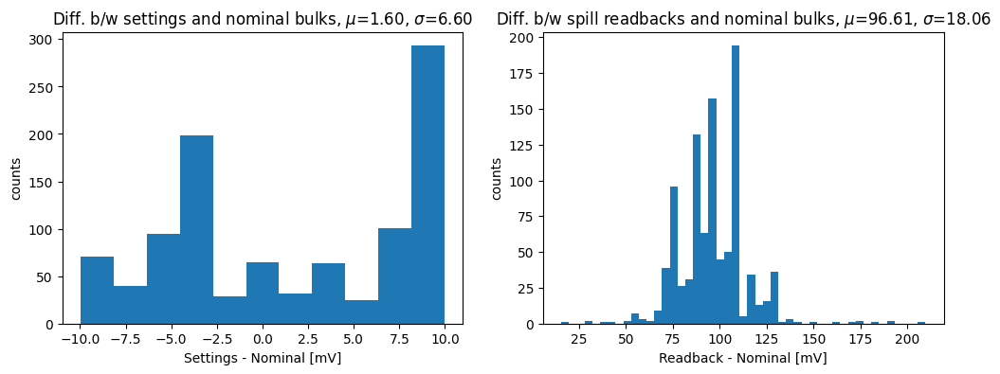

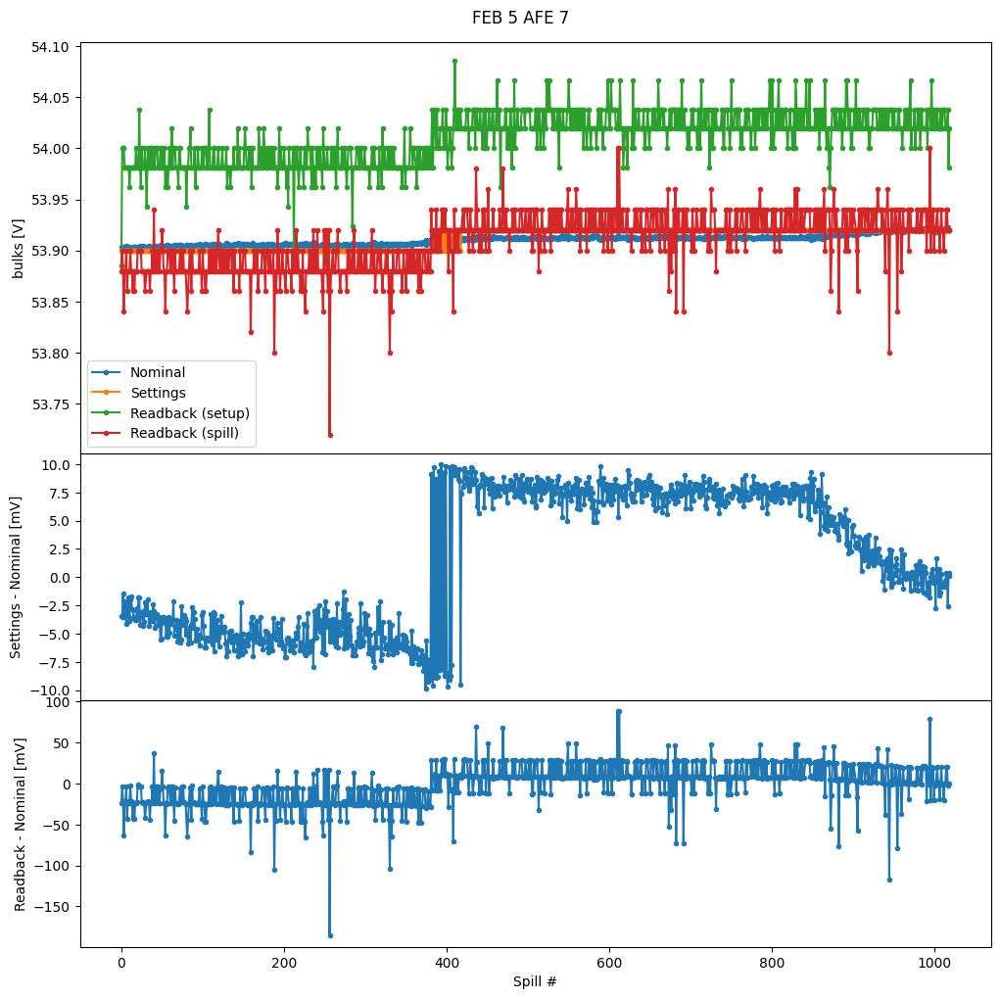

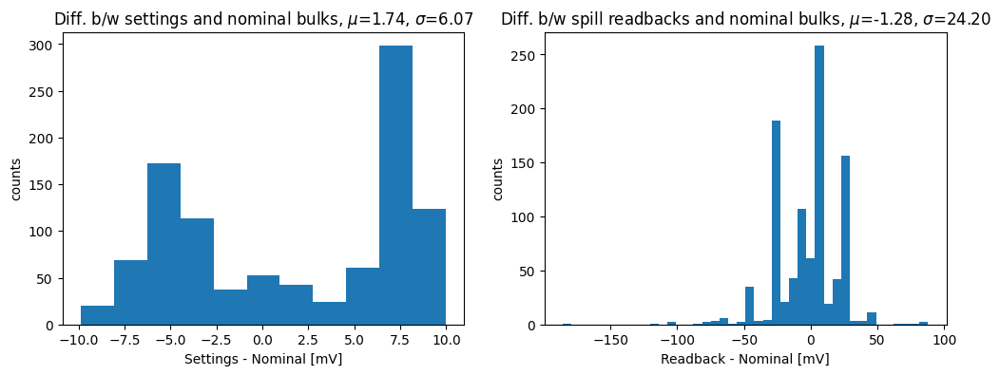

In [5]:
for iFEB in range(6):
    df_ = df.query("FEB==%i & goodFEBTemp==True & goodReadbk==True"%iFEB).reset_index()
    # display(df_)
    for iAFE in range(8):
        fig = plt.figure(figsize = (12,11))
        fig.subplots_adjust(top=0.95)
        plt.suptitle('FEB %i AFE %i'%(iFEB, iAFE))
        axs = fig.subplots(3, 1, sharex='col',
                           gridspec_kw={'height_ratios':[5,3,3],
                                        'wspace':0, 'hspace':0})

        ytitles = ['bulks [V]', 'Settings - Nominal [mV]', 'Readback - Nominal [mV]']
        for ii in range(3):
            axs[ii].set_ylabel(ytitles[ii])
        axs[2].set_xlabel('Spill #')

        axs[0].plot(df_['spillNum'], df_['bulkNominal%i'%iAFE]*0.02, '.-', label=('Nominal'))
        axs[0].plot(df_['spillNum'], df_['bulkSettings%i'%iAFE]*0.02, '.-', label=('Settings'))
        axs[0].plot(df_['spillNum'], df_['readBackVAtSetup%i'%iAFE], '.-', label=('Readback (setup)'))
        axs[0].plot(df_['spillNum'][df_['goodRdbkSpill']], df_['readBackVAtSpill%i'%iAFE][df_['goodRdbkSpill']], '.-', label=('Readback (spill)'))
        axs[0].legend()

        diffSettingNom = np.subtract(df_['bulkSettings%i'%iAFE]*20 ,df_['bulkNominal%i'%iAFE]*20)
        axs[1].plot(df_['spillNum'], diffSettingNom, '.-')
        #diffReadbkNom = np.subtract(df_['readBackVAtSetup%i'%iAFE]*1000 ,df_['bulkNominal%i'%iAFE]*20)
        #axs[2].plot(df_['spillNum'], diffReadbkNom, '.-')
        diffReadbkNom = np.subtract(df_['readBackVAtSpill%i'%iAFE][df_['goodRdbkSpill']]*1000 ,df_['bulkNominal%i'%iAFE][df_['goodRdbkSpill']]*20)
        axs[2].plot(df_['spillNum'][df_['goodRdbkSpill']], diffReadbkNom, '.-')
        plt.show()
        plt.close(fig)
        
        fig, axs = plt.subplots(1,2,figsize=(12,4))
        axs[0].hist(diffSettingNom, bins='auto')
        axs[0].set_title("Diff. b/w settings and nominal bulks, "+r'$\mu$'+"=%.2f"%(np.mean(diffSettingNom))+r', $\sigma$'+"=%.2f"%(np.std(diffSettingNom)))
        axs[0].set_xlabel(ytitles[1])
        axs[0].set_ylabel("counts")
        axs[1].hist(diffReadbkNom, bins='auto')
        axs[1].set_title("Diff. b/w spill readbacks and nominal bulks, "+r'$\mu$'+"=%.2f"%(np.mean(diffReadbkNom))+r', $\sigma$'+"=%.2f"%(np.std(diffReadbkNom)))
        axs[1].set_xlabel(ytitles[2])
        axs[1].set_ylabel("counts")
        plt.show()
        plt.close(fig)
        

In [1]:
from __future__ import print_function
import sys, os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages

import ROOT
from ROOT import gROOT, gStyle, gDirectory, gPad

from array import array
import pandas as pd
import pickle
from scipy import stats
from scipy.stats import norm

import settings_FEB
import constants
import crv_event
import crv_spill
import utils
import geometry
import geometry_constants
import filepath

gROOT.Reset()
gROOT.SetBatch(1)
gROOT.ProcessLine( "gErrorIgnoreLevel = 1001;")
gStyle.SetOptStat(111110)
gStyle.SetOptFit(0)
gStyle.SetLineScalePS(0.3)

topdir = os.path.dirname(os.path.abspath("__file__"))
analysis_dir = os.path.join(topdir,"analysis_root_files")
settings_dir = os.path.join(topdir,"settings")

filename = filepath.getfilelist([1678],"recoROOT",5)[0][0]
pklname = os.path.join(analysis_dir,"dynamic_Vbias_test_run_check.pkl")

def SPE_extract(filename):
    df_SPE = pd.DataFrame()
    df_temp = pd.DataFrame()
    
    fFile = ROOT.TFile(filename, "READ")
    runNum = filepath.filenameparser(filename, 'run') 
    subrunNum = filepath.filenameparser(filename, 'subrun') 

    runSummarytree = fFile.Get("runSummary")
    runtree = fFile.Get("run")
    spilltree = fFile.Get("spills")
    nSpill = spilltree.GetEntries()
    spilltree.GetEntry(0)
    nFEB = spilltree.spill_number_of_febs
    runSummarytree.GetEntry(0)
    pedestal = np.reshape(np.array(runSummarytree.pedestals, dtype=np.float32), (nFEB, geometry_constants.nChannelPerFEB))
    nEvent = runtree.GetEntries()

    for iSpill in range(nSpill):
        tSpill = crv_spill.crv_spill(spilltree, iSpill)
        
        for iFEB in range(nFEB):
            for iAFE in range(8):
                ch = iAFE * 8 # just do one channel for each AFE
                df_ = pd.DataFrame()
                df_['spill'] = [iSpill]
                df_['FEB'] = [iFEB]
                df_['AFE'] = [iAFE]
                df_['Ch'] = [ch]
                df_['FEBTemp'] = [tSpill.temperatureFEB[iFEB]]
                df_['CMBTemp'] = [tSpill.temperatureCMB[iFEB][ch]]
                df_temp = pd.concat([df_temp,df_], ignore_index=True)    
    
    for iEvent in range(nEvent):
        if iEvent!=0 and iEvent%500==0:
            print("Processed %i/%i events..."%(iEvent, nEvent))
        tEvent = crv_event.crv_event(runtree, iEvent, 0b1100, nFEB)
        SPE_list = tEvent.FillCalibrationHistogramsStock(pedestal, None, None, True)

        for iFEB in range(nFEB):
            for iAFE in range(8):
                ch = iAFE * 8 # just do one channel for each AFE
                for val in SPE_list[iFEB][ch]:
                    df_ = pd.DataFrame()
                    df_['spill'] = [tEvent.spillNumber]
                    df_['FEB'] = [iFEB]
                    df_['AFE'] = [iAFE]
                    df_['Ch'] = [ch]
                    df_['SPE'] = [val]
                
                    df_SPE = pd.concat([df_SPE,df_], ignore_index=True)

    fFile.Close()
    return nSpill, df_temp, df_SPE            

Welcome to JupyROOT 6.28/04


In [2]:
nSpill, df_temp, df_SPE = SPE_extract(filename)
print(nSpill)
display(df_temp)
display(df_SPE)

with open(pklname, 'wb') as f:
    pickle.dump(df_temp, f)
    pickle.dump(df_SPE, f)

Processed 500/209328 events...
Processed 1000/209328 events...
Processed 1500/209328 events...
Processed 2000/209328 events...
Processed 2500/209328 events...
Processed 3000/209328 events...
Processed 3500/209328 events...
Processed 4000/209328 events...
Processed 4500/209328 events...
Processed 5000/209328 events...
Processed 5500/209328 events...
Processed 6000/209328 events...
Processed 6500/209328 events...
Processed 7000/209328 events...
Processed 7500/209328 events...
Processed 8000/209328 events...
Processed 8500/209328 events...
Processed 9000/209328 events...
Processed 9500/209328 events...
Processed 10000/209328 events...
Processed 10500/209328 events...
Processed 11000/209328 events...
Processed 11500/209328 events...
Processed 12000/209328 events...
Processed 12500/209328 events...
Processed 13000/209328 events...
Processed 13500/209328 events...
Processed 14000/209328 events...
Processed 14500/209328 events...
Processed 15000/209328 events...
Processed 15500/209328 events.

,spill,FEB,AFE,Ch,FEBTemp,CMBTemp
0,0,0,0,0,41.00,23.4375
1,0,0,1,8,41.00,23.6250
2,0,0,2,16,41.00,23.5000
3,0,0,3,24,41.00,23.4375
4,0,0,4,32,41.00,23.4375
...,...,...,...,...,...,...
48859,1017,5,3,24,44.42,23.1875
48860,1017,5,4,32,44.42,22.8750
48861,1017,5,5,40,44.42,22.9375
48862,1017,5,6,48,44.42,23.5000


,spill,FEB,AFE,Ch,SPE
0,1,0,6,48,416.853716
1,1,2,1,8,599.106126
2,1,3,1,8,530.439261
3,1,4,5,40,400.336089
4,1,5,1,8,371.499332
...,...,...,...,...,...
875113,1018,1,3,24,473.315794
875114,1018,4,3,24,428.098760
875115,1018,4,5,40,291.195333
875116,1018,2,4,32,460.464545


In [61]:
binSize = 10
beginHist = 100.
nbins = 60

def plotSPEoverSpill(nFEB, nSpill, df_SPE, df_temp, nCombineSpill):
    for iFEB in range(nFEB):
        for iAFE in range(8):
            df_ = df_SPE.query("FEB==%i & AFE==%i"%(iFEB, iAFE)).reset_index()
            
            fig = plt.figure(figsize = (12,9))
            fig.subplots_adjust(top=0.95)
            plt.suptitle('FEB %i AFE %i (Ch %i)'%(iFEB, iAFE, iAFE*8))
            axs = fig.subplots(2, 1, sharex='col',
                               gridspec_kw={'height_ratios':[6,3],
                                            'wspace':0, 'hspace':0})

            ytitles = ['Dark pulses [ADC*ns]', 'SPE [ADC*ns]']
            for ii in range(2):
                axs[ii].set_ylabel(ytitles[ii])
            axs[1].set_xlabel('Spill #')

            h = axs[0].hist2d(df_['spill'], df_['SPE'], 
                              bins = [[nCombineSpill*i-0.5 for i in range(int(nSpill/nCombineSpill)+1)], 
                                      [beginHist+binSize*i for i in range(nbins+1)]], 
                              cmap='inferno')
            fig.colorbar(h[3], ax=axs[0], location='top', shrink=0.4)

            meanSpill = []
            meanSPE = []
            meanSPEerr = []
            SPEshifted = []
            SPE0 = None
            CMBTemp0 = None
            FEMTemp0 = None
            for i in range(int(nSpill/nCombineSpill)):
                df_spill_ = df_.query("spill>=%i & spill<%i"%(nCombineSpill*i, nCombineSpill*(i+1))).reset_index()
                hist = ROOT.TH1F("hist", ";;", nbins, beginHist, beginHist+nbins*binSize)
                for val in df_spill_['SPE']:
                    hist.Fill(val)
                maxbin = 0
                maxbinContent = 0
                for ibin in range(1, hist.GetNbinsX()):
                    if hist.GetBinCenter(ibin)<250:
                        continue # find 1PE maximum only between 350 and 1100
                    if hist.GetBinCenter(ibin)>1500:
                        break # 1100
                    binContent = hist.GetBinContent(ibin)
                    if binContent > maxbinContent:
                        maxbin=ibin
                        maxbinContent=binContent
                peak1PE = hist.GetBinCenter(maxbin)
                func1 = ROOT.TF1("f1", "gaus", peak1PE*0.9, peak1PE*1.1)
                func1.SetParameter(1, peak1PE)
                hist.Fit(func1, "QRL")
                peak1PE = func1.GetParameter(1)
                peak1PEerr = func1.GetParError(1)

                meanSpill.append(nCombineSpill*i-0.5+nCombineSpill/2.)
                meanSPE.append(peak1PE)
                meanSPEerr.append(peak1PEerr)
                hist.IsA().Destructor(hist)
                func1.IsA().Destructor(func1)

                df_temp_spill_ = df_temp.query("FEB==%i & AFE==%i & spill>=%i & spill<%i"%(iFEB, iAFE, nCombineSpill*i, nCombineSpill*(i+1))).reset_index()
                
                FEBTempMask = (df_temp_spill_['FEBTemp'] > 1) & (df_temp_spill_['FEBTemp'] < 100)
                CMBTempMask = (df_temp_spill_['CMBTemp'] > -29)                
                meanFEBTemp = np.mean(df_temp_spill_['FEBTemp'][FEBTempMask])
                meanCMBTemp = np.mean(df_temp_spill_['CMBTemp'][CMBTempMask])

                if SPE0 is None:
                    SPE0 = peak1PE
                    CMBTemp0 = meanCMBTemp
                    FEMTemp0 = meanFEBTemp

                expectedSPE = SPE0 + ((meanCMBTemp - CMBTemp0) * (-55.4) + (meanFEBTemp - FEMTemp0) * 4.09) * 0.1255 + (meanFEBTemp - FEMTemp0) * (-1.46)
                SPEshifted.append(expectedSPE)

            axs[1].errorbar(meanSpill, meanSPE, xerr = nCombineSpill/2., yerr = meanSPEerr, linestyle='none', label='SPE from data')
            axs[1].errorbar(meanSpill, SPEshifted+(np.mean(meanSPE)-SPE0), xerr = nCombineSpill/2., linestyle='none', label='w/o dynamic bias')
            axs[1].legend(fontsize='small')

            plt.show()
            plt.close(fig)

            '''
            print(meanSPE)
            print(SPEshifted)
            print(np.mean(meanSPE))
            '''

    return


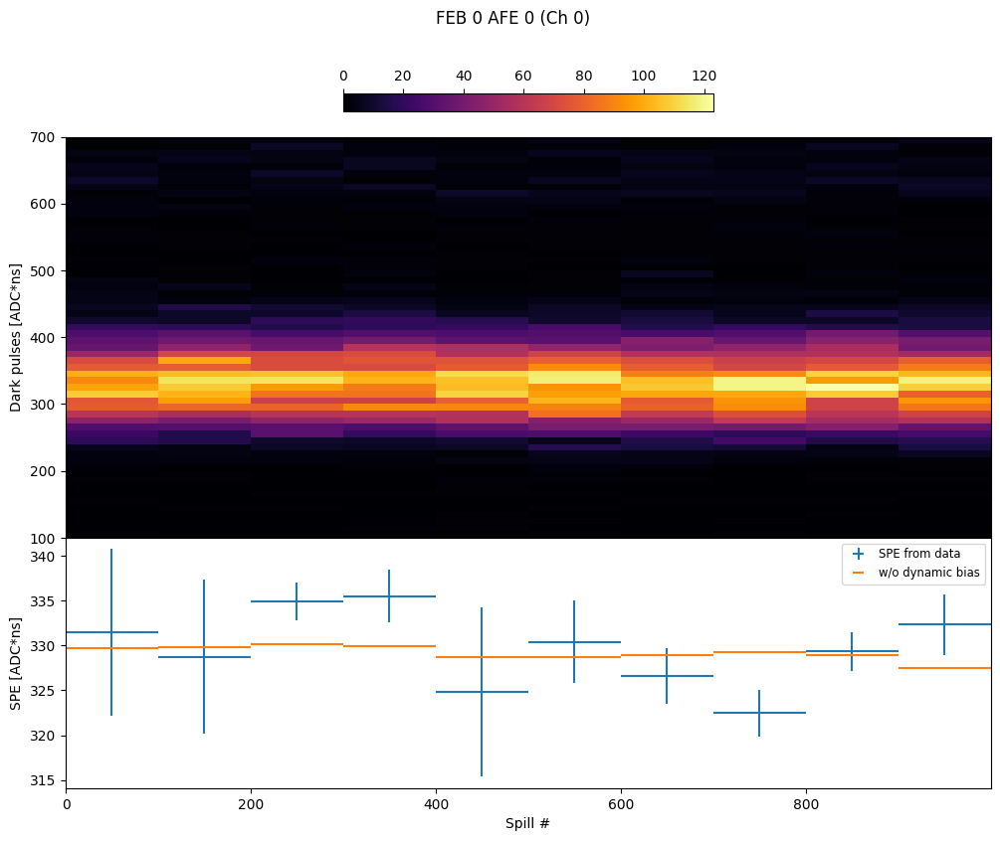

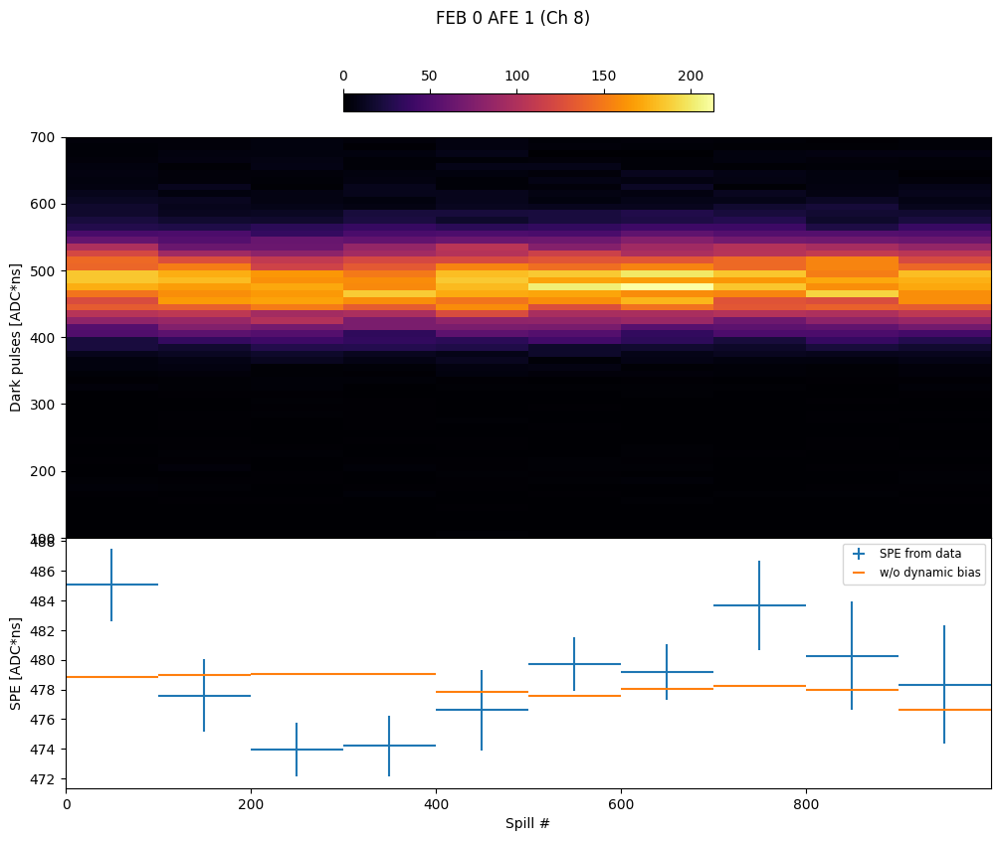

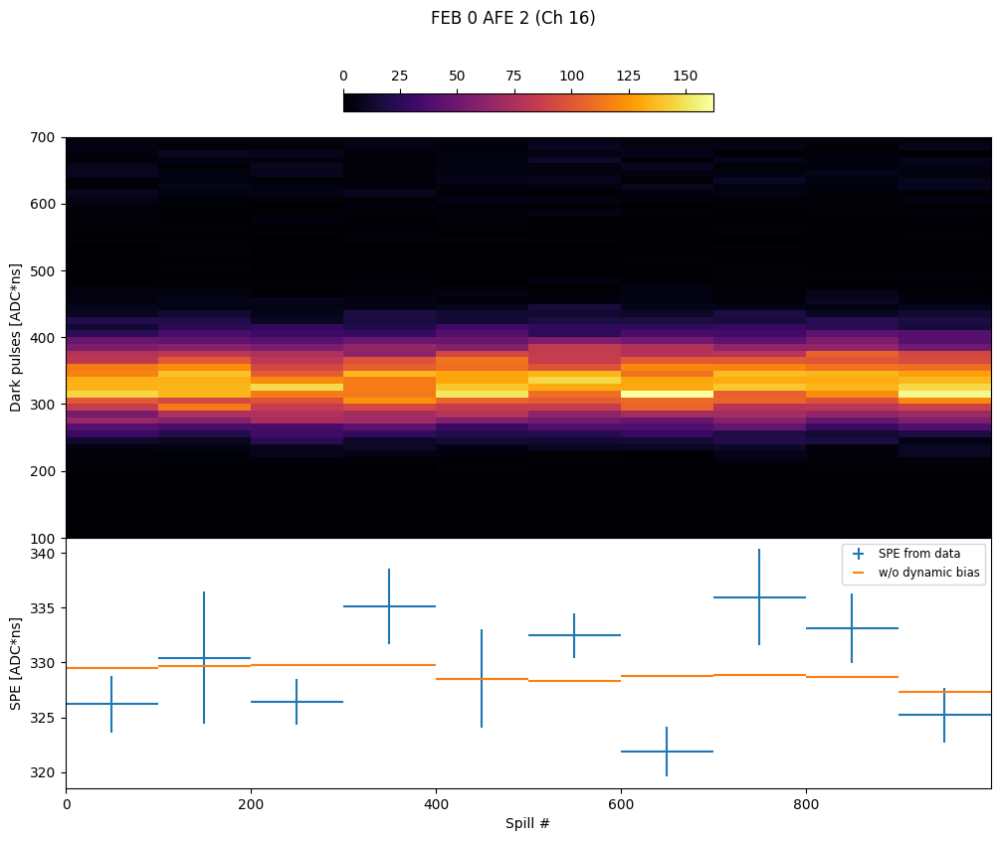

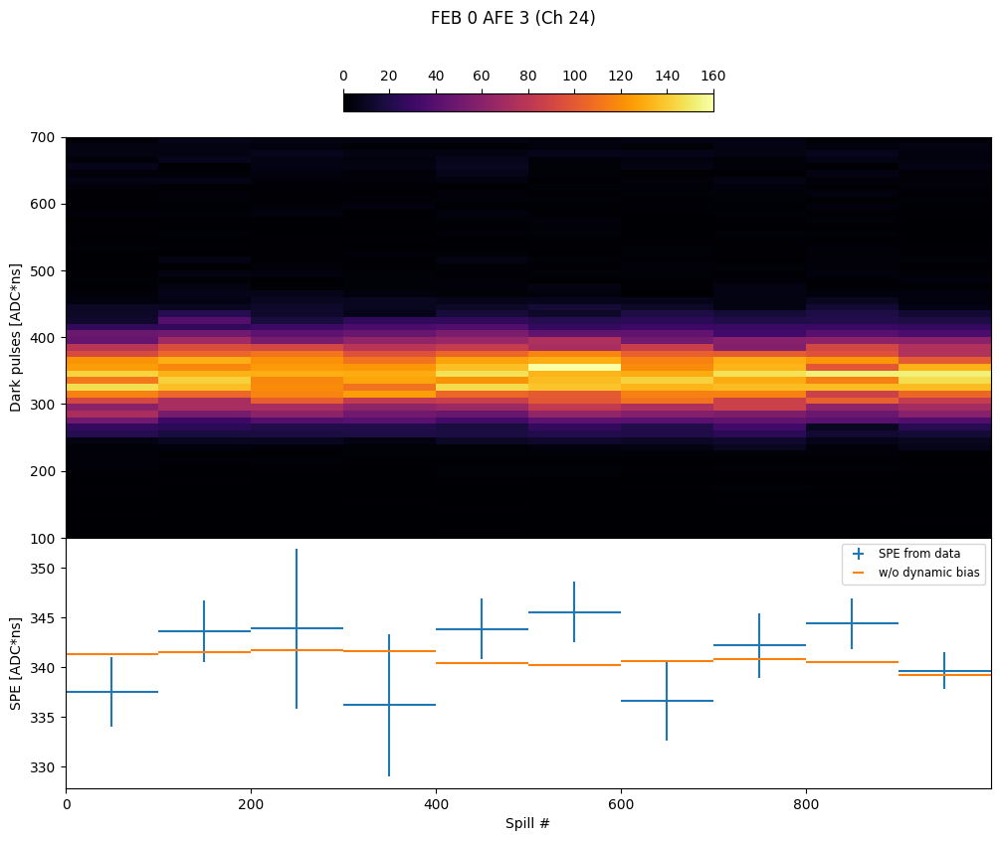

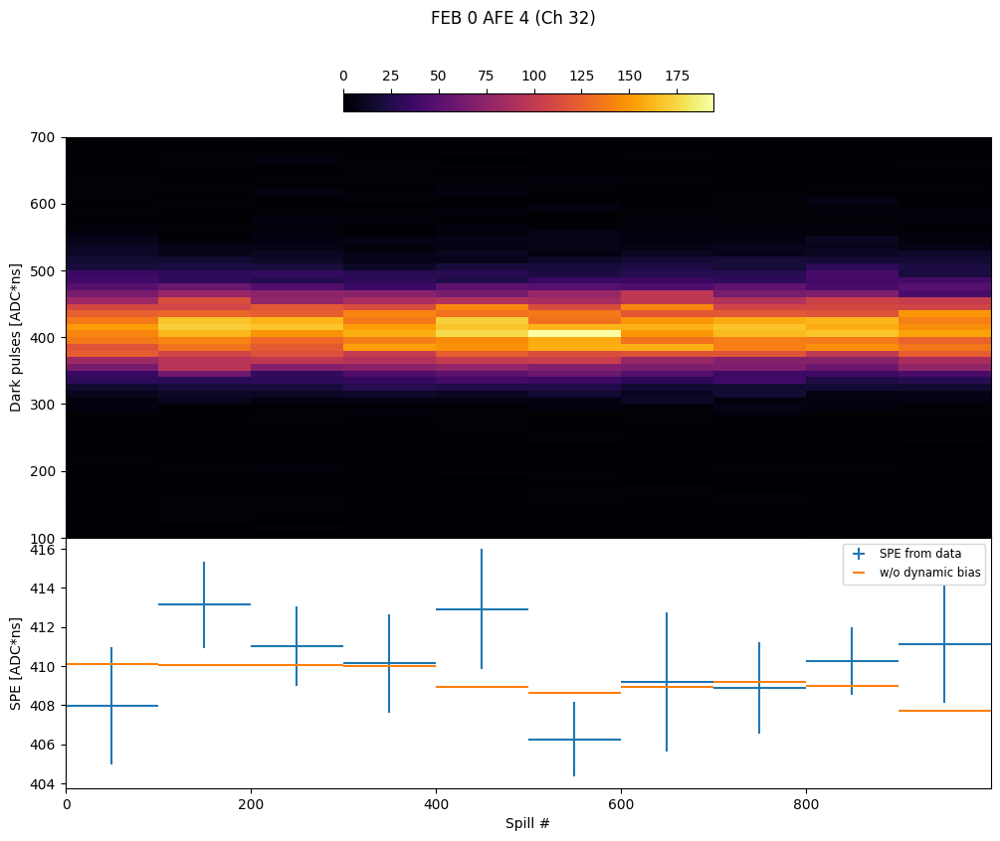

...

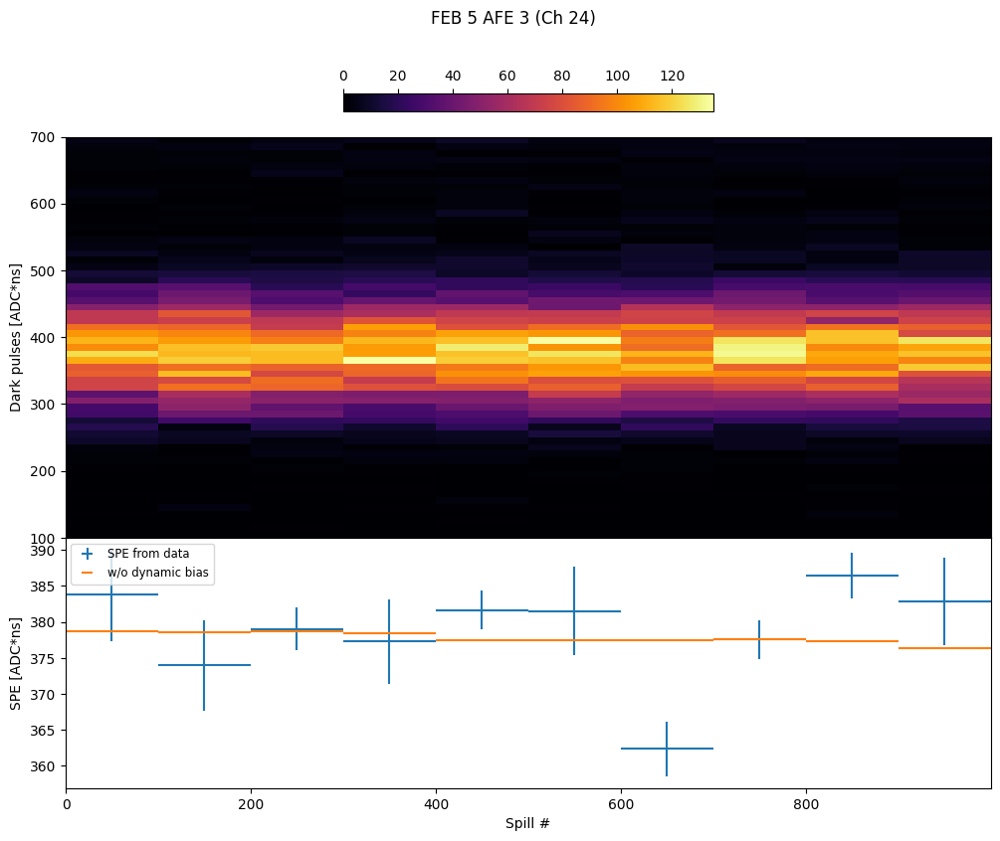

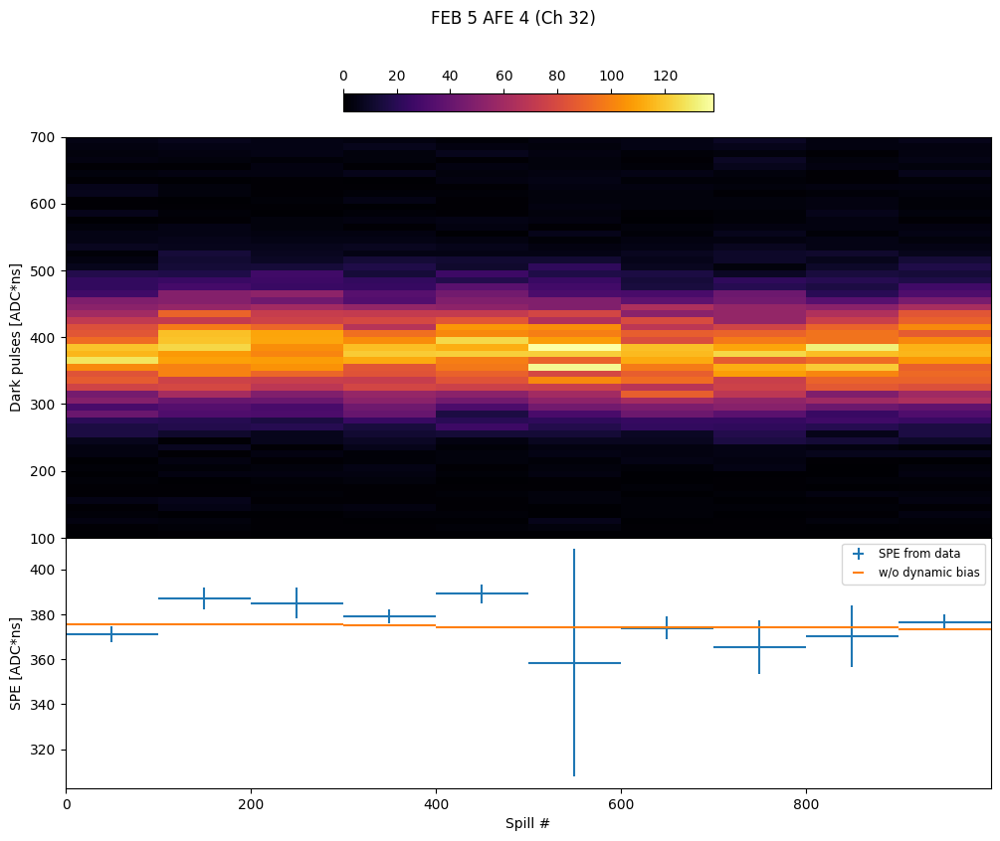

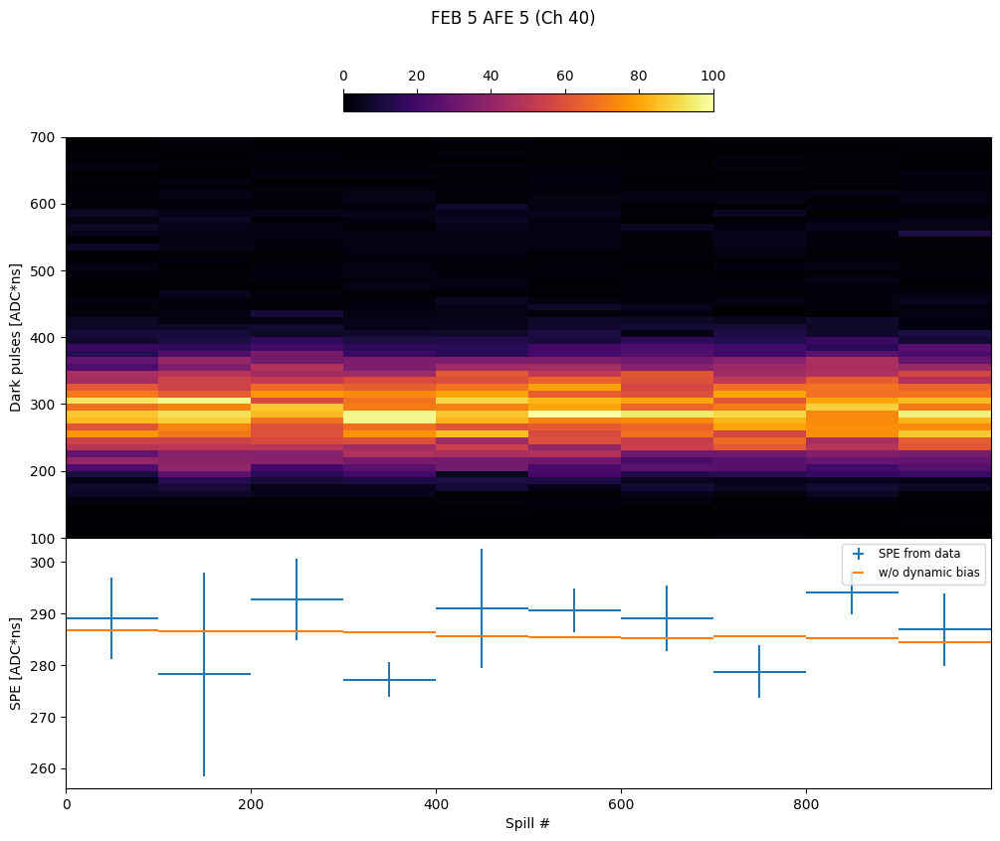

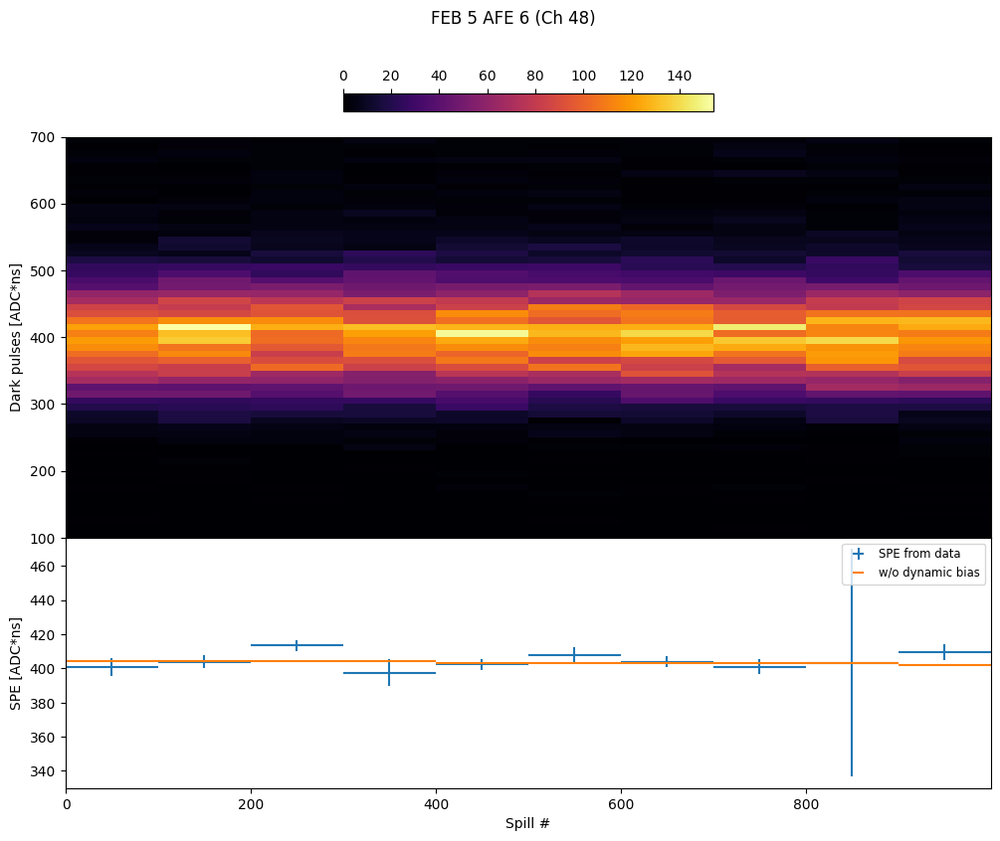

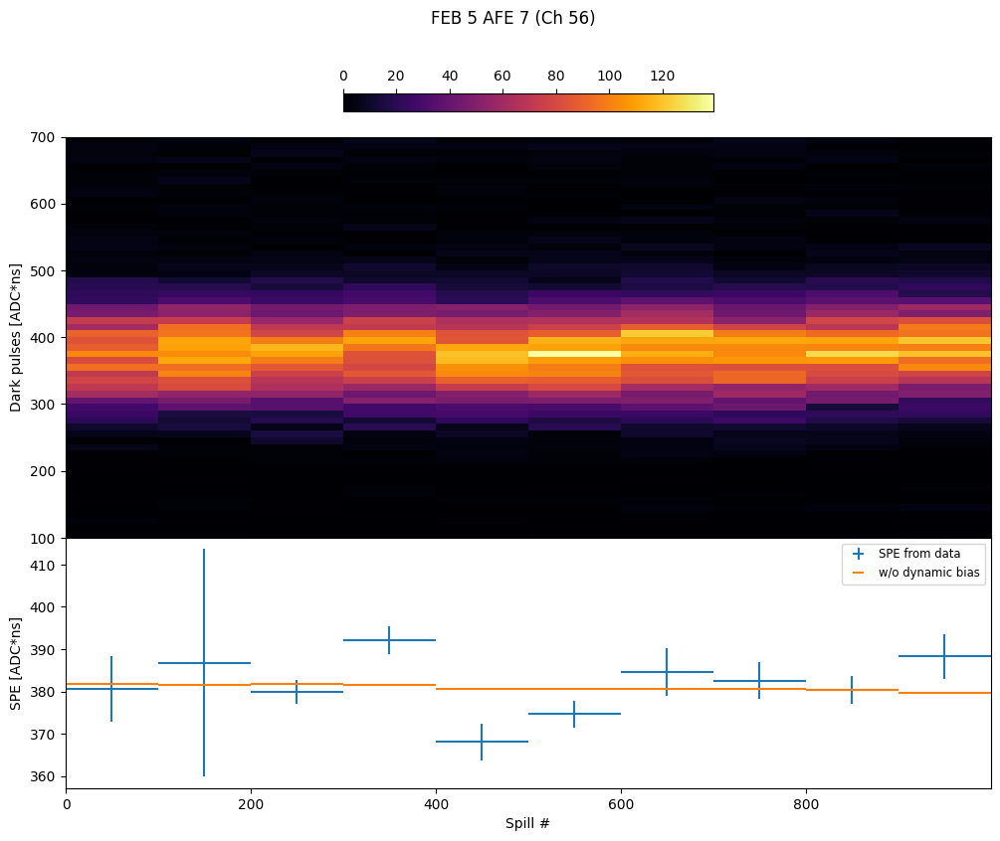

In [63]:
with open(pklname, 'rb') as f:
    df_temp = pickle.load(f)
    df_SPE = pickle.load(f)
    
plotSPEoverSpill(6, nSpill, df_SPE, df_temp, 100)            